# Ноутбук №1. Neural Style Transfer

## Выполнил Александр Чернышёв

__Введение:__ Мой диплом для универа был связан как раз с переносом стиля, поэтому большую часть кода я буду использовать из диплома. Также мой код выложен в открытый доступ: https://github.com/sasasagagaga/diploma-hungarian-algorithm
Изначальная версия кода была взята из репозитория Леона Гатиса (https://github.com/leongatys/PytorchNeuralStyleTransfer) и большая его часть была почти полностью переписана. Почти неизменным остался класс сети VGG.

---

## Если вы выбрали Neural Style Transfer
---------------------------------------
Тут все довольно просто на первый и на второй взгляд. Поэтому недосотаточно просто написать свою функцию потерь и сдать ноутбук. Если вы хотите приличных баллов, то у вас есть две опции:


1. Вы разделяете картинку на две части и переносите на них разные стили. <p><span style="color:red">Нельзя просто взять и два раза применить обычную архитектуру сначала к одной чати картинки, а потом к другой.</span></p> От вас ожидается, что вы отдадите нейросети два картинки стиля и она внутри себя(скорее внутри лосс функции) разделит выходную картинку на две части и к одной части применит один стиль, а к другой - второй. 

2. Вы переносите *одновременно* два стиля на одну картинку контента.
<p><span style="color:red">Нельзя просто взять и два раза применить обычную архитектуру сначала с одним стилем, а потом с другим.</span></p>
От вас ожидается, что вы модифицируете модель(скорее лосс модели) для того, чтобы два стиля учитывались с разными весами. 

## Импортируем библиотеки

In [1]:
from Code import image_utils as IU, losses, style_transfer as ST, VGG

from argparse import Namespace

import torch
import torch.nn as nn

## Код для стилизации сразу двумя стилями

In [2]:
def combined_style_transfer(style1, style2, content, opt_img_rand=False, verbose=3, **style_transfer_kwargs):
    style1 = IU.load_image(style1, style=True)
    style2 = IU.load_image(style2, style=True)
    content = IU.load_image(content, content=True)

    if opt_img_rand:  # Оптимизируем лосс из белого шума
        opt_img = torch.randn_like(content, device=core.device, requires_grad=True)
    else:  # Оптимизируем лосс из контента
        opt_img = content.detach().clone().requires_grad_(True)

    if verbose >= 10:
        IU.show(style1, style2, content, opt_img, cols=4)

    vgg = VGG.get_vgg_instance()
    style1_params, content_params = ST.make_losses_weigths_targets(
        style1,
        content,
        style_loss_weight_callback=ST.gatys_style_loss_weight_callback,
        vgg=vgg
    )
    style2_params = ST.make_losses_weigths_targets(
        style2,
        content,
        style_loss_weight_callback=ST.gatys_style_loss_weight_callback,
        vgg=vgg
    )[0]

    style_params = Namespace(
        loss_layers=style1_params.loss_layers + style2_params.loss_layers,
        loss_fns=style1_params.loss_fns + style2_params.loss_fns,
        loss_weights=[x / 2 for x in style1_params.loss_weights + style2_params.loss_weights],
        targets=style1_params.targets + style2_params.targets
    )

    results = ST.style_transfer(
        opt_img,
        style_params,
        content_params,
        equalize_content_and_style=False,
        wanted_style_losses_contrib=False,
        tv_loss_weight=100,
        verbose=verbose,
        vgg=vgg,
        **style_transfer_kwargs
    )

    return Namespace(
        style1=style1,
        style2=style2,
        content=content,
        **vars(results)
    )

In [11]:
def plot_results(res):
    IU.show(
        (res.style1, 'Стиль 1'),
        (res.style2, 'Стиль 2'),
        (res.content, 'Контент'),
        (res.opt_img, 'Стилизация'),
        cols=2, img_size=6, fontsize=16
    )

## Эксперименты

Iteration: 100, loss: 561003776.000, last 100 iters time: 6.731905937194824, avg iter time: 0.06731905937194824


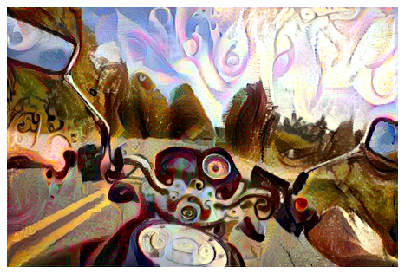

Iteration: 200, loss: 559466368.000, last 100 iters time: 9.398462295532227, avg iter time: 0.09398462295532227


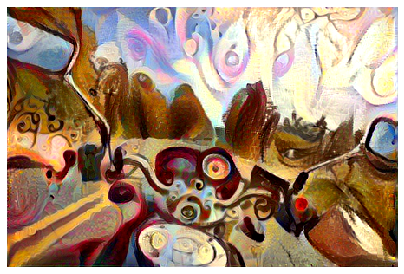

Iteration: 300, loss: 559049792.000, last 100 iters time: 9.331571340560913, avg iter time: 0.09331571340560912


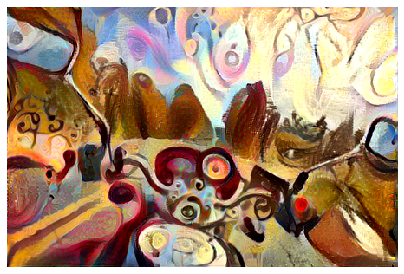

Iteration: 400, loss: 558868864.000, last 100 iters time: 9.33711051940918, avg iter time: 0.0933711051940918


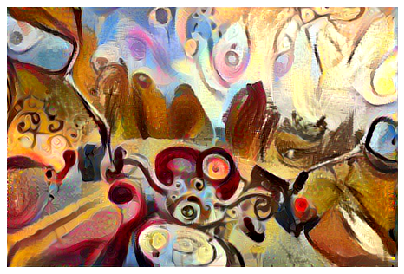

Iteration: 500, loss: 558771456.000, last 100 iters time: 9.609175443649292, avg iter time: 0.09609175443649293


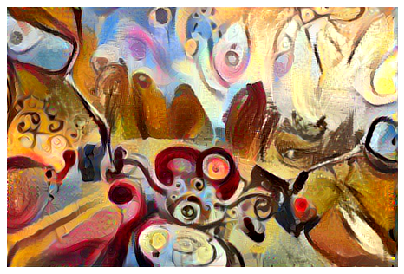

In [3]:
res = combined_style_transfer(1, 11, 0)

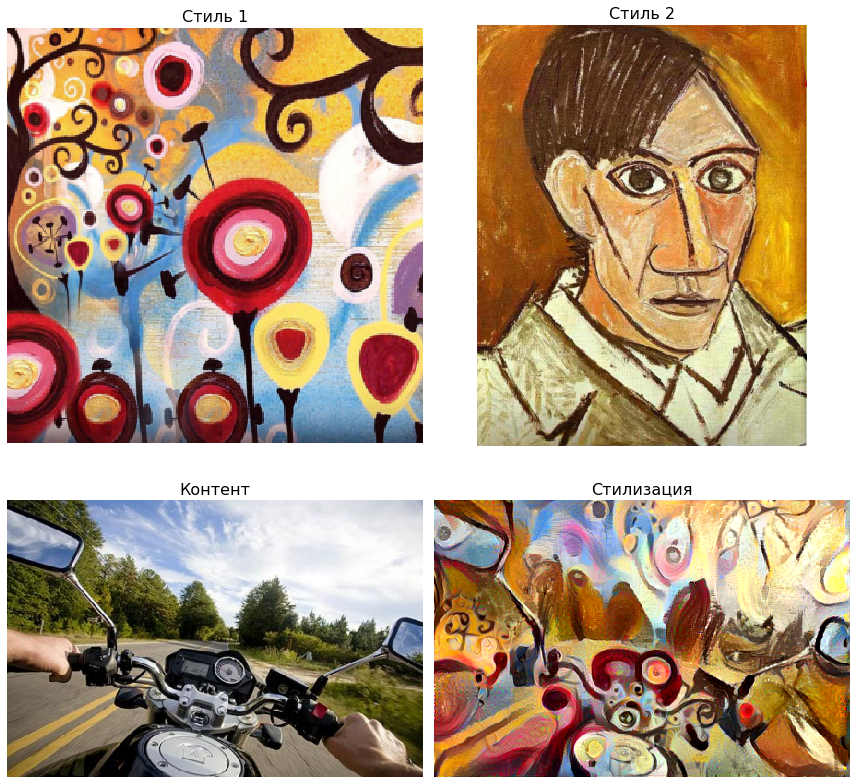

In [12]:
plot_results(res)

## Посмотрим, как будут выглядеть стилизации при наложении только первого или второго из стилей

### Накладываем только стиль 1:

Iteration: 100, loss: 8368387.500, last 100 iters time: 6.549936771392822, avg iter time: 0.06549936771392822


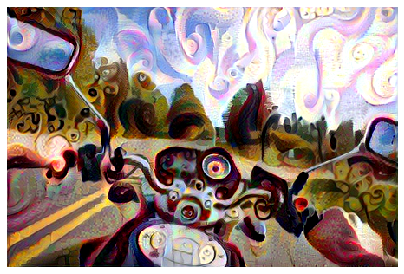

Iteration: 200, loss: 4291601.000, last 100 iters time: 9.744878053665161, avg iter time: 0.09744878053665161


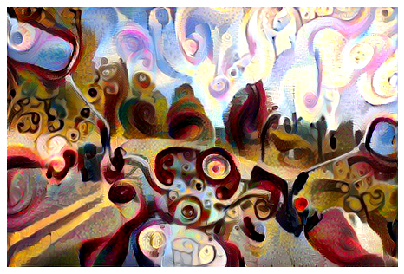

Iteration: 300, loss: 3270484.250, last 100 iters time: 9.818006992340088, avg iter time: 0.09818006992340088


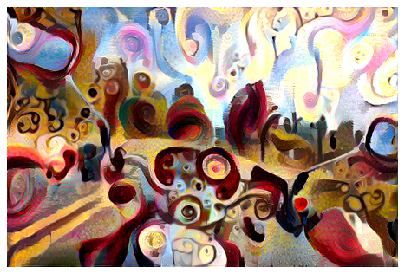

Iteration: 400, loss: 2803296.000, last 100 iters time: 9.809841871261597, avg iter time: 0.09809841871261597


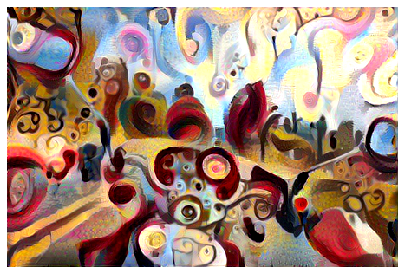

Iteration: 500, loss: 2561177.000, last 100 iters time: 9.834638595581055, avg iter time: 0.09834638595581055


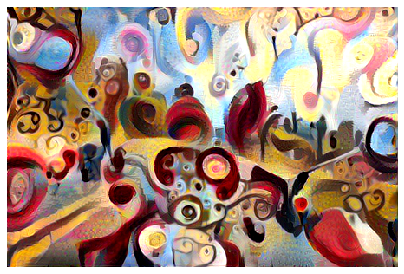

In [19]:
res1 = combined_style_transfer(1, 1, 0)

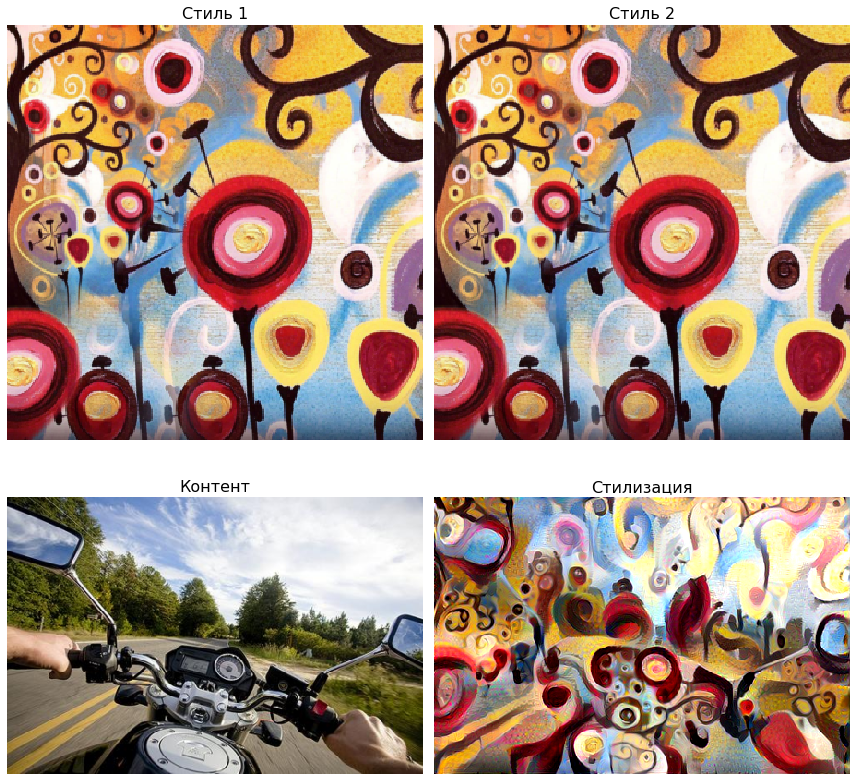

In [20]:
plot_results(res1)

### Накладываем только стиль 2:

Iteration: 100, loss: 2118947.750, last 100 iters time: 6.566420555114746, avg iter time: 0.06566420555114746


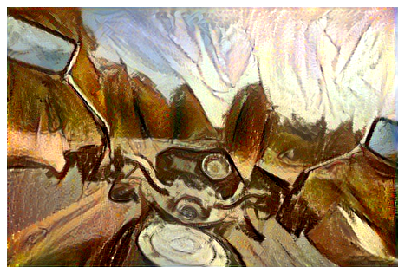

Iteration: 200, loss: 1210553.750, last 100 iters time: 9.272736549377441, avg iter time: 0.09272736549377442


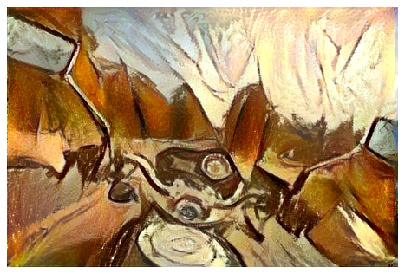

Iteration: 300, loss: 969675.125, last 100 iters time: 9.622348070144653, avg iter time: 0.09622348070144654


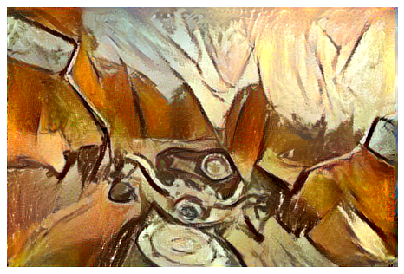

Iteration: 400, loss: 876873.188, last 100 iters time: 9.843627214431763, avg iter time: 0.09843627214431763


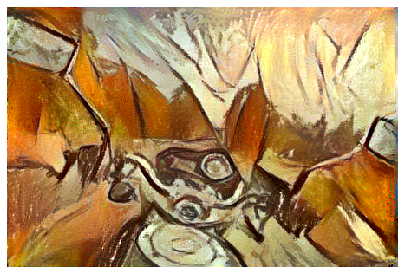

Iteration: 500, loss: 832807.000, last 100 iters time: 9.879764080047607, avg iter time: 0.09879764080047608


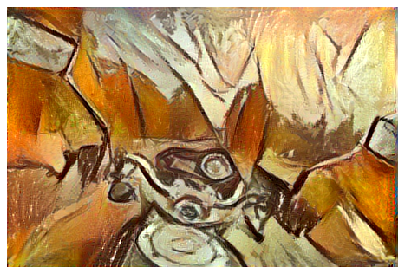

In [16]:
res2 = combined_style_transfer(11, 11, 0)

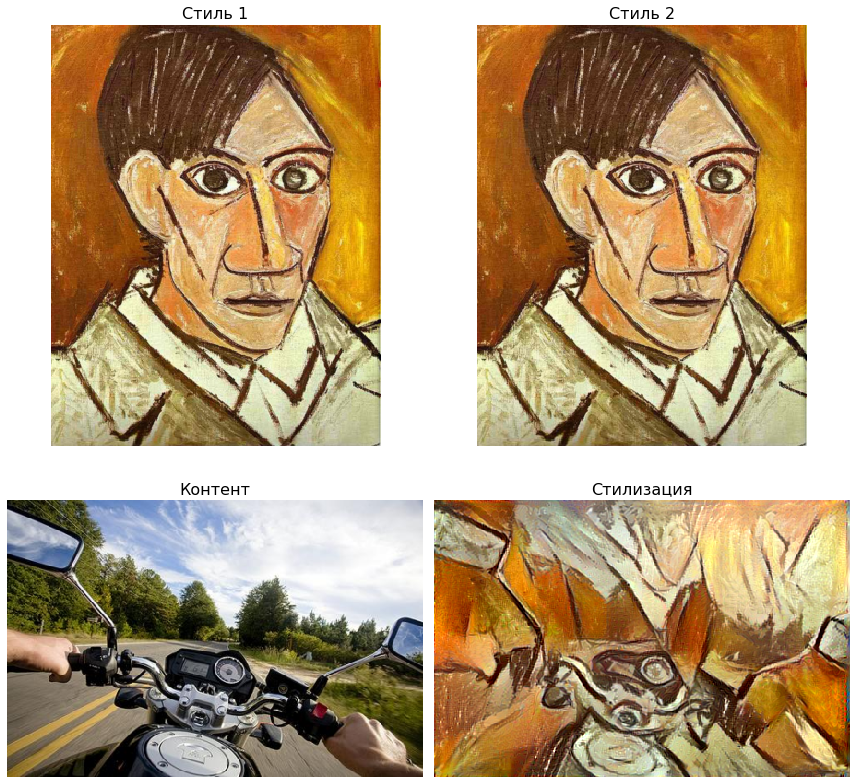

In [17]:
plot_results(res2)

## Сравним полученные стилизации

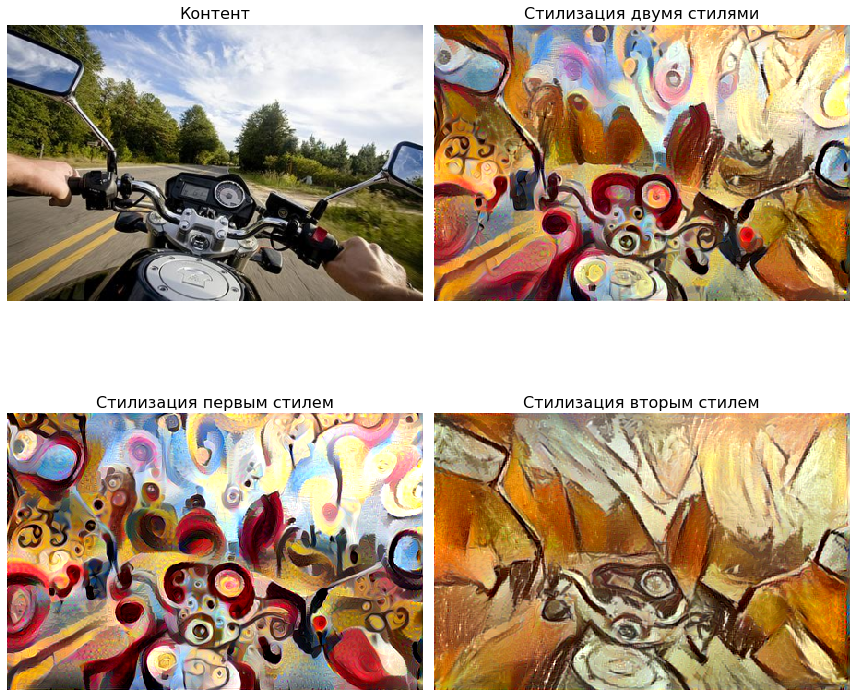

In [21]:
IU.show(
    (res.content, 'Контент'),
    (res.opt_img, 'Стилизация двумя стилями'),
    (res1.opt_img, 'Стилизация первым стилем'),
    (res2.opt_img, 'Стилизация вторым стилем'),
    cols=2, img_size=6, fontsize=16
)

__Выводы:__ Как видим, на стилизации с двумя стилями действительно получилось что-то среднее между стилизациями только одним из стилей.

## Еще немного стилизаций

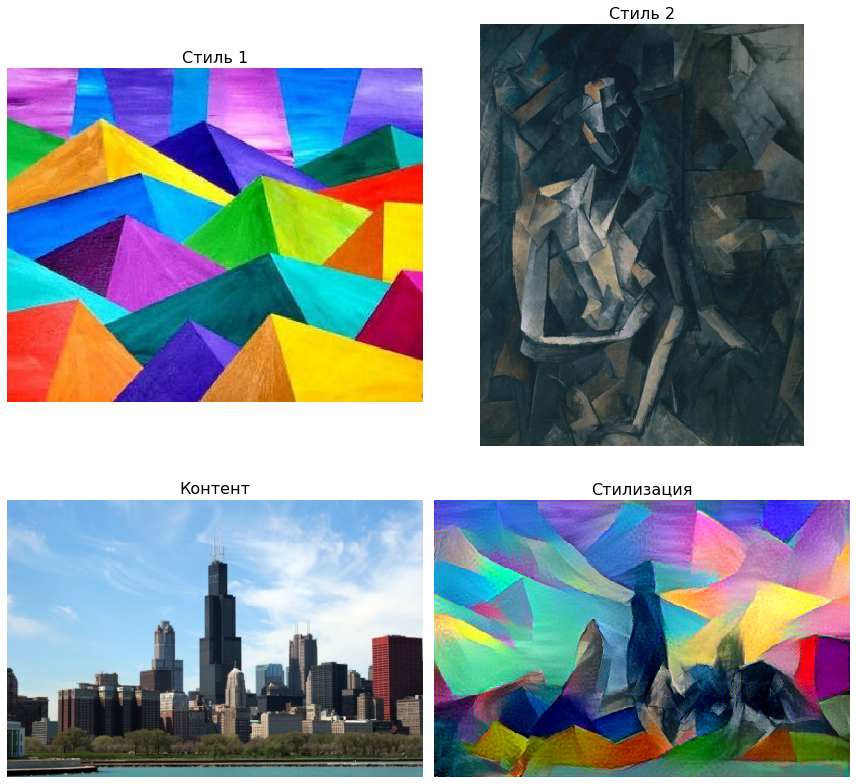

In [24]:
res = combined_style_transfer(10, 12, 3, verbose=0, print_iter=False, show_iter=False)
plot_results(res)

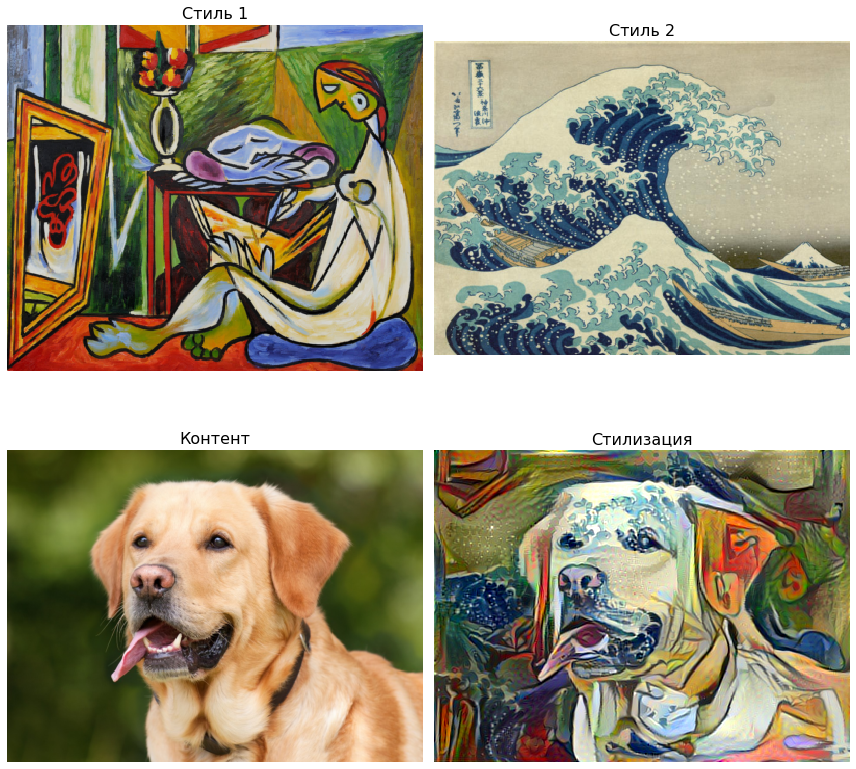

In [25]:
res = combined_style_transfer(7, 19, 4, verbose=0, print_iter=False, show_iter=False)
plot_results(res)

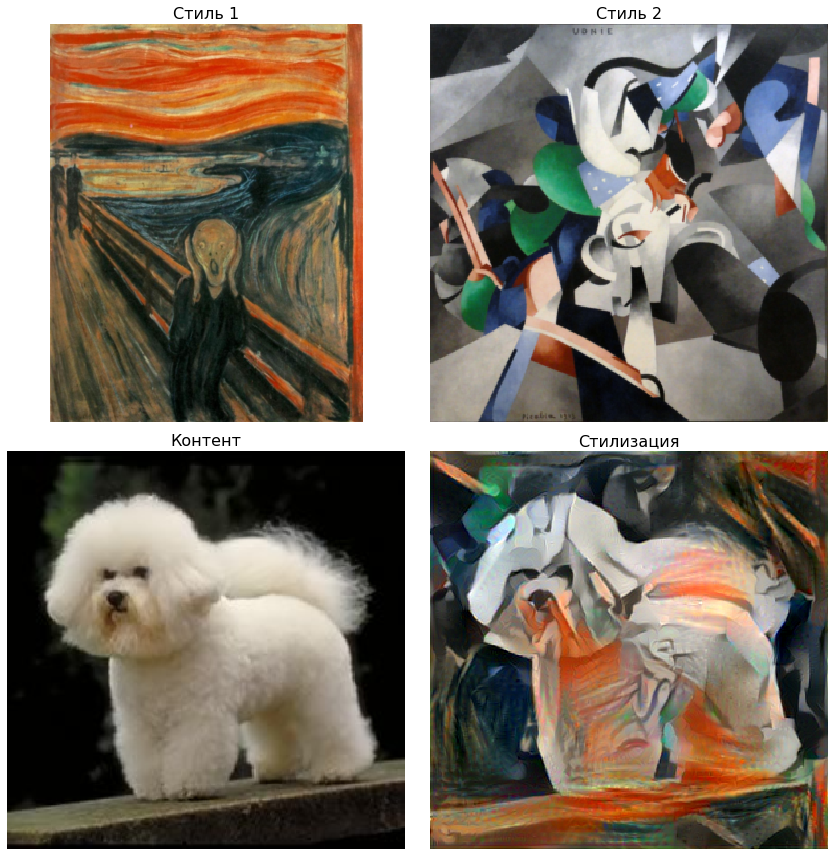

In [26]:
res = combined_style_transfer(16, 17, 5, verbose=0, print_iter=False, show_iter=False)
plot_results(res)

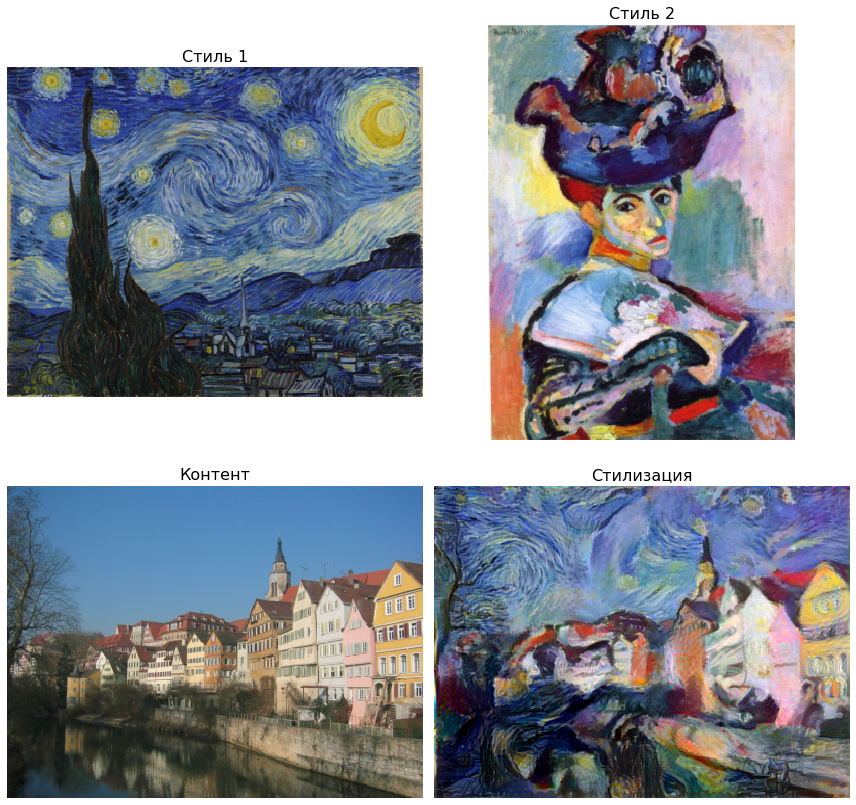

In [28]:
res = combined_style_transfer(18, 20, 9, verbose=0, print_iter=False, show_iter=False)
plot_results(res)